<a href="https://colab.research.google.com/github/acecode101/Food_calorie_estimator/blob/main/Food_calorie_estimator.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [25]:
!pip install tensorflow opencv-python matplotlib

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [26]:
from google.colab import files
uploaded = files.upload()

import zipfile
import os

for file in uploaded.keys():
    with zipfile.ZipFile(file, 'r') as zip_ref:
        zip_ref.extractall('/content/')

Saving food_dataset.zip to food_dataset (1).zip


In [27]:
train_dir = "/content/food_dataset"

datagen = ImageDataGenerator(preprocessing_function=preprocess_input, validation_split=0.2)

train_gen = datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='training'
)

val_gen = datagen.flow_from_directory(
    train_dir,
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical',
    subset='validation'
)

class_names = list(train_gen.class_indices.keys())
print("Detected classes:", class_names)


Found 2684 images belonging to 5 classes.
Found 667 images belonging to 5 classes.
Detected classes: ['apple', 'banana', 'burger', 'pizza', 'salad']


In [28]:
base_model = MobileNetV2(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(128, activation='relu')(x)
predictions = Dense(len(class_names), activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=predictions)

for layer in base_model.layers:
    layer.trainable = False

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer_1[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,422,597 (9.24 MB)

 Trainable params: 164,613 (643.02 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [29]:
history = model.fit(
    train_gen,
    validation_data=val_gen,
    epochs=5
)

Epoch 1/5


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


84/84 ━━━━━━━━━━━━━━━━━━━━ 95s 1s/step - accuracy: 0.8624 - loss: 0.4025 - val_accuracy: 0.9700 - val_loss: 0.0919
Epoch 2/5
84/84 ━━━━━━━━━━━━━━━━━━━━ 80s 949ms/step - accuracy: 0.9927 - loss: 0.0324 - val_accuracy: 0.9775 - val_loss: 0.0649
Epoch 3/5
84/84 ━━━━━━━━━━━━━━━━━━━━ 80s 958ms/step - accuracy: 0.9962 - loss: 0.0183 - val_accuracy: 0.9745 - val_loss: 0.0804
Epoch 4/5
84/84 ━━━━━━━━━━━━━━━━━━━━ 81s 965ms/step - accuracy: 0.9996 - loss: 0.0069 - val_accuracy: 0.9775 - val_loss: 0.0707
Epoch 5/5
84/84 ━━━━━━━━━━━━━━━━━━━━ 86s 1s/step - accuracy: 1.0000 - loss: 0.0037 - val_accuracy: 0.9835 - val_loss: 0.0729


In [30]:
calorie_dict = {
    'apple': 52,
    'banana': 89,
    'burger': 295,
    'pizza': 266,
    'salad': 33
}

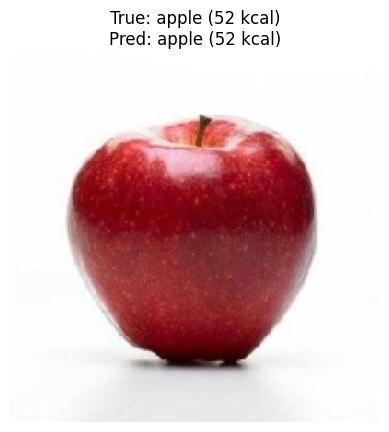

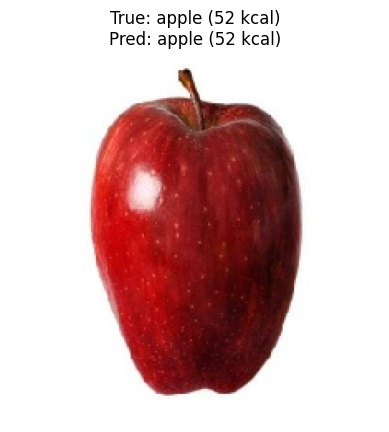

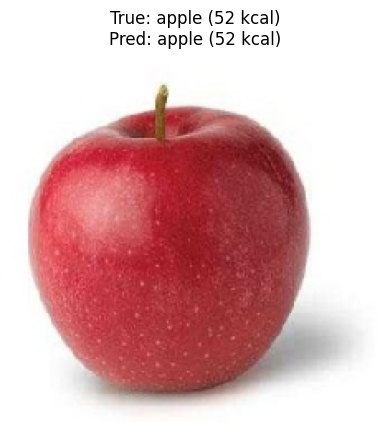

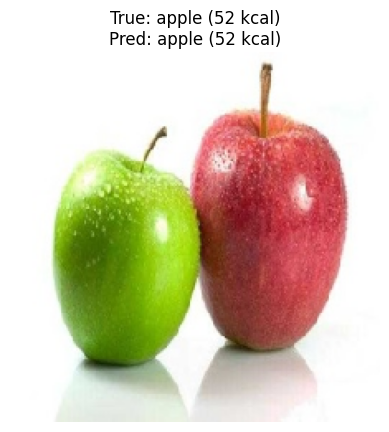

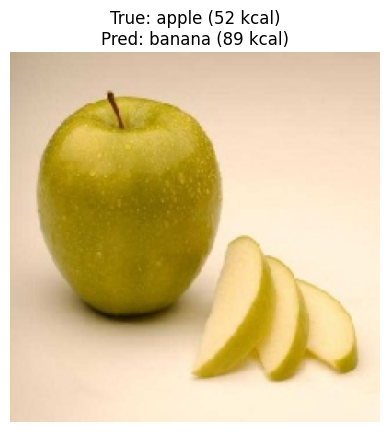

...

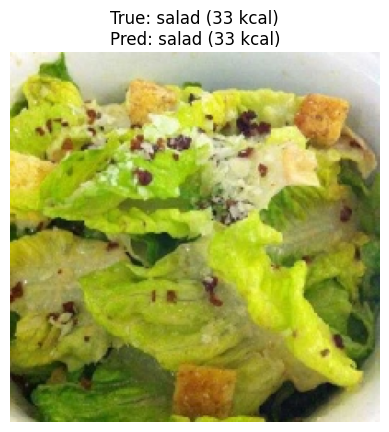

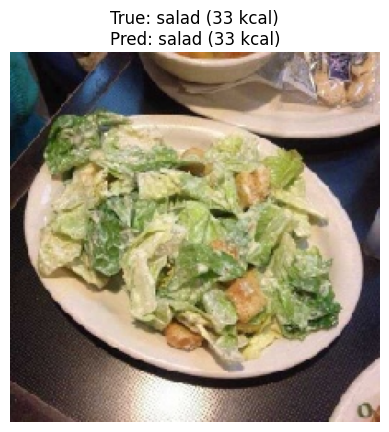

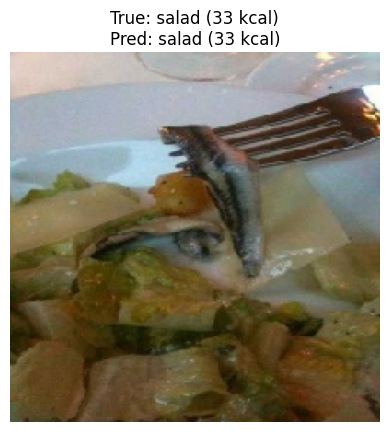

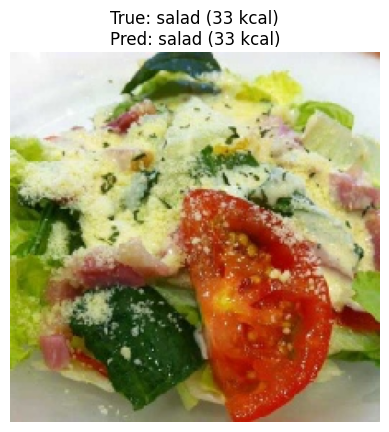

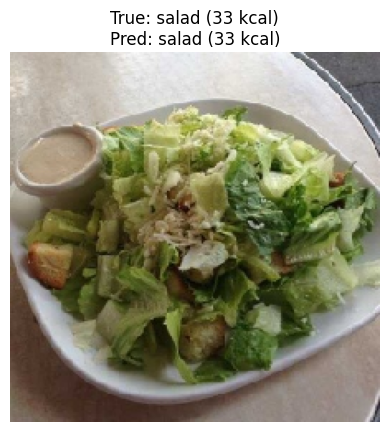


📊 MAE: 15.30 kcal
📊 RMSE: 59.76 kcal


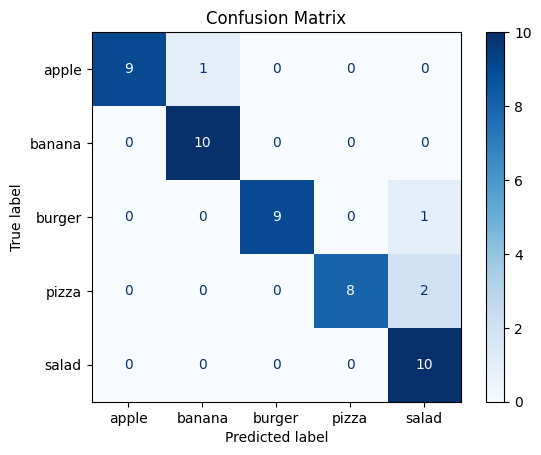

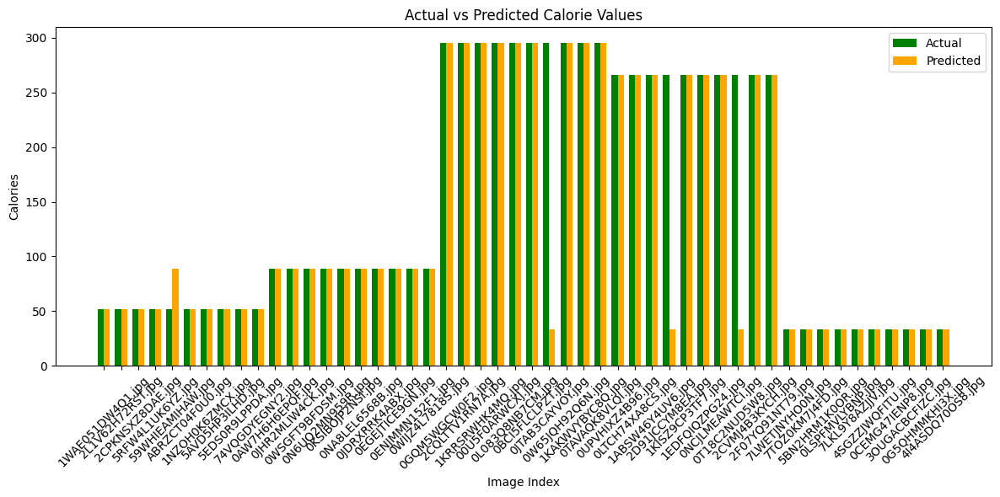

In [43]:
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, confusion_matrix, ConfusionMatrixDisplay
import math
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

# Correct test root path
test_root = "/content/test_images/test_images"

# Calorie dictionary
calorie_dict = {
    'apple': 52,
    'banana': 89,
    'burger': 295,
    'pizza': 266,
    'salad': 33
}

# Get class names
class_names = list(calorie_dict.keys())

# Store metrics
true_calories = []
predicted_calories = []
true_labels = []
predicted_labels = []
image_names = []

# Process test images
for class_label in class_names:
    class_folder = os.path.join(test_root, class_label)
    if not os.path.exists(class_folder):
        print(f"❌ Folder not found: {class_folder}")
        continue

    images = [f for f in os.listdir(class_folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))][:10]

    for img_name in images:
        img_path = os.path.join(class_folder, img_name)
        try:
            img = image.load_img(img_path, target_size=(224, 224))
            img_array = image.img_to_array(img)
            img_array = preprocess_input(img_array)
            img_array = np.expand_dims(img_array, axis=0)

            # Prediction
            prediction = model.predict(img_array, verbose=0)
            predicted_class = class_names[np.argmax(prediction[0])]

            # Get calorie values
            actual_cal = calorie_dict.get(class_label, 0)
            predicted_cal = calorie_dict.get(predicted_class, 0)

            # Store data
            true_calories.append(actual_cal)
            predicted_calories.append(predicted_cal)
            true_labels.append(class_label)
            predicted_labels.append(predicted_class)
            image_names.append(img_name)

            # Show image
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"True: {class_label} ({actual_cal} kcal)\nPred: {predicted_class} ({predicted_cal} kcal)")
            plt.show()

        except Exception as e:
            print(f"Error with image {img_name}: {e}")

# ---------- METRICS ----------
mae = mean_absolute_error(true_calories, predicted_calories)
rmse = math.sqrt(mean_squared_error(true_calories, predicted_calories))
print(f"\n📊 MAE: {mae:.2f} kcal")
print(f"📊 RMSE: {rmse:.2f} kcal")

# ---------- CONFUSION MATRIX ----------
cm = confusion_matrix(true_labels, predicted_labels, labels=class_names)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.show()

# ---------- BAR CHART: Actual vs Predicted Calories ----------
x = np.arange(len(image_names))
width = 0.35

plt.figure(figsize=(12, 6))
plt.bar(x - width/2, true_calories, width, label='Actual', color='green')
plt.bar(x + width/2, predicted_calories, width, label='Predicted', color='orange')
plt.xlabel('Image Index')
plt.ylabel('Calories')
plt.title('Actual vs Predicted Calorie Values')
plt.xticks(x, image_names, rotation=45)
plt.legend()
plt.tight_layout()
plt.show()



📄 Classification Report:


,precision,recall,f1-score,support
apple,1.000000,0.90,0.947368,10.00
banana,0.909091,1.00,0.952381,10.00
burger,1.000000,0.90,0.947368,10.00
pizza,1.000000,0.80,0.888889,10.00
salad,0.769231,1.00,0.869565,10.00
accuracy,0.920000,0.92,0.920000,0.92
macro avg,0.935664,0.92,0.921114,50.00
weighted avg,0.935664,0.92,0.921114,50.00



📊 Per-Class Error Metrics:
Apple: MAE = 3.70, RMSE = 11.70
Banana: MAE = 0.00, RMSE = 0.00
Burger: MAE = 26.20, RMSE = 82.85
Pizza: MAE = 46.60, RMSE = 104.20
Salad: MAE = 0.00, RMSE = 0.00


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128204 (\N{PUSHPIN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


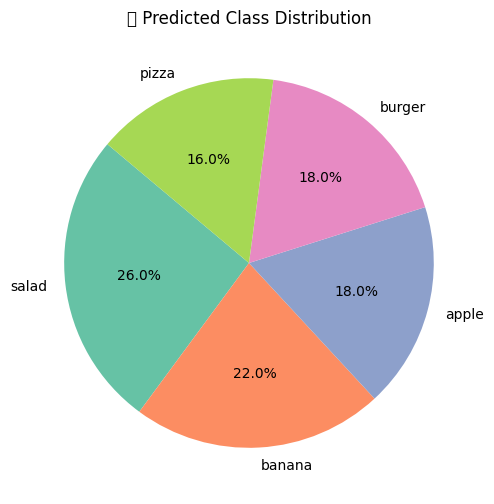

<ipython-input-44-2030738196>:41: UserWarning: Glyph 128201 (\N{CHART WITH DOWNWARDS TREND}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128201 (\N{CHART WITH DOWNWARDS TREND}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


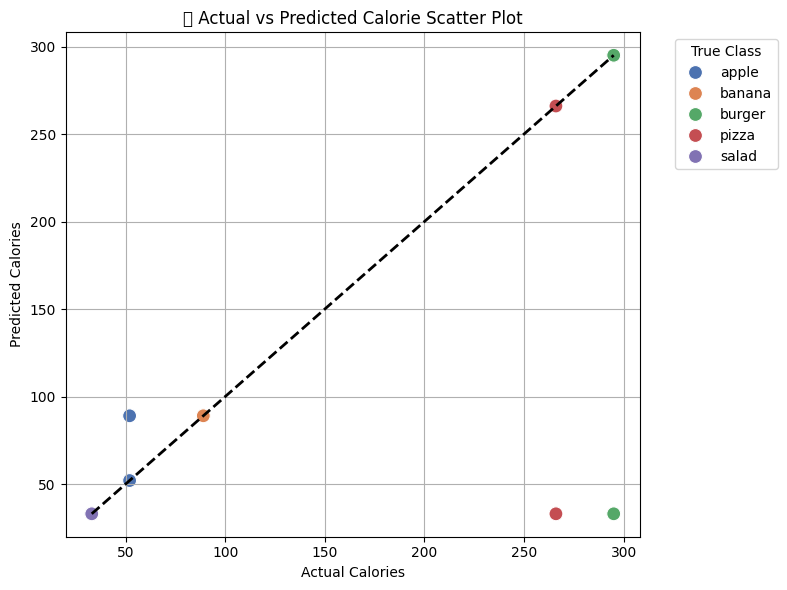

In [44]:
from sklearn.metrics import classification_report
import pandas as pd
import seaborn as sns

# ----- 1. Classification Report -----
print("\n📄 Classification Report:")
report = classification_report(true_labels, predicted_labels, target_names=class_names, output_dict=True)
df_report = pd.DataFrame(report).transpose()
display(df_report)

# ----- 2. Per-Class MAE and RMSE -----
print("\n📊 Per-Class Error Metrics:")
class_errors = {}

for cls in class_names:
    cls_indices = [i for i, label in enumerate(true_labels) if label == cls]
    if cls_indices:
        cls_true = [true_calories[i] for i in cls_indices]
        cls_pred = [predicted_calories[i] for i in cls_indices]
        cls_mae = mean_absolute_error(cls_true, cls_pred)
        cls_rmse = math.sqrt(mean_squared_error(cls_true, cls_pred))
        class_errors[cls] = (cls_mae, cls_rmse)
        print(f"{cls.capitalize()}: MAE = {cls_mae:.2f}, RMSE = {cls_rmse:.2f}")

# ----- 3. Pie Chart: Class Distribution of Predictions -----
plt.figure(figsize=(6, 6))
pred_counts = pd.Series(predicted_labels).value_counts()
plt.pie(pred_counts, labels=pred_counts.index, autopct='%1.1f%%', startangle=140, colors=sns.color_palette("Set2"))
plt.title("📌 Predicted Class Distribution")
plt.show()

# ----- 4. Scatter Plot: Actual vs Predicted Calories -----
plt.figure(figsize=(8, 6))
sns.scatterplot(x=true_calories, y=predicted_calories, hue=true_labels, palette="deep", s=100)
plt.plot([min(true_calories), max(true_calories)], [min(true_calories), max(true_calories)], 'k--', lw=2)
plt.xlabel("Actual Calories")
plt.ylabel("Predicted Calories")
plt.title("📉 Actual vs Predicted Calorie Scatter Plot")
plt.legend(title="True Class", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()

In [45]:
from sklearn.metrics import accuracy_score

# --------- ACCURACY ----------
accuracy = accuracy_score(true_labels, predicted_labels)
print(f"✅ Model Classification Accuracy: {accuracy * 100:.2f}%")


✅ Model Classification Accuracy: 92.00%
